In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go

In [ ]:
df=pd.read_csv('master.csv')

In [ ]:
df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z


In [ ]:
#Describe function includes analysis of all our numerical data.
df.describe()

,year,suicides_no,population,suicides/100k pop,HDI for year,gdp_per_capita ($)
count,27820.000000,27820.000000,2.782000e+04,27820.000000,8364.000000,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,0.776601,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,0.093367,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,0.483000,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,0.713000,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,0.779000,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,0.855000,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,0.944000,126352.000000


In [ ]:
#Check for null values
df.isnull().sum()

country                   0
year                      0
sex                       0
age                       0
suicides_no               0
population                0
suicides/100k pop         0
country-year              0
HDI for year          19456
 gdp_for_year ($)         0
gdp_per_capita ($)        0
generation                0
dtype: int64

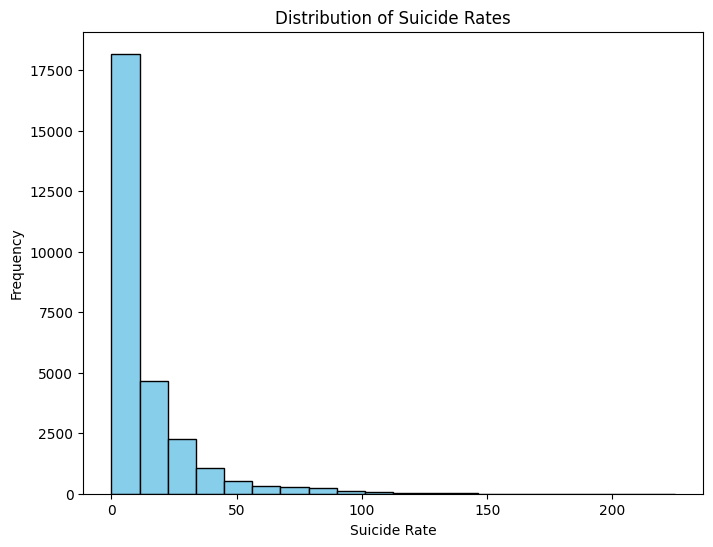

In [ ]:
# Summary Statistics
plt.figure(figsize=(8, 6))
plt.hist(df['suicides/100k pop'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Suicide Rates')
plt.xlabel('Suicide Rate')
plt.ylabel('Frequency')
plt.show()

In [ ]:
df['age'].unique()

array(['15-24 years', '35-54 years', '75+ years', '25-34 years',
       '55-74 years', '5-14 years'], dtype=object)

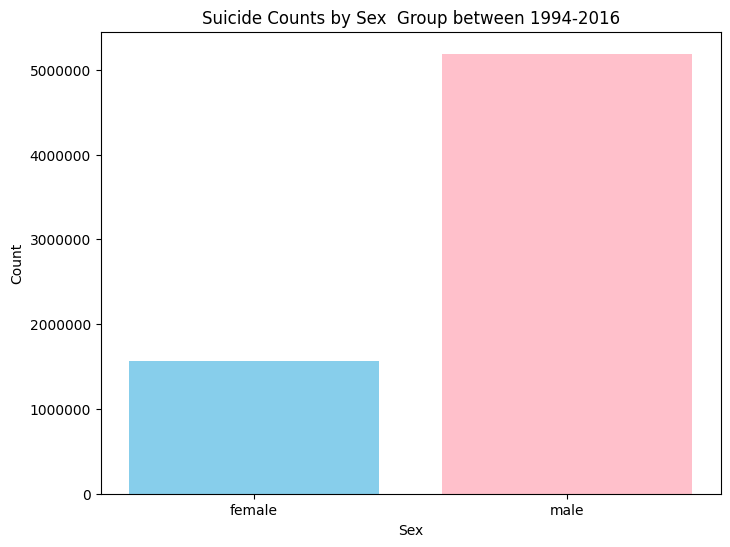

In [ ]:
# Grouping the DataFrame by 'sex' and summing 'count of suicides'
sex_suicides = df.groupby('sex')['suicides_no'].sum().reset_index()

# Create a bar chart to visualize the number of suicides by sex
plt.figure(figsize=(8, 6))
plt.bar(sex_suicides['sex'], sex_suicides['suicides_no'], color=['skyblue', 'pink'])
plt.title('Suicide Counts by Sex  Group between 1994-2016')
plt.xlabel('Sex')
plt.ylabel('Count')

# Set y-axis format to 'plain' to remove scientific notation
plt.ticklabel_format(style='plain', axis='y')


plt.show()

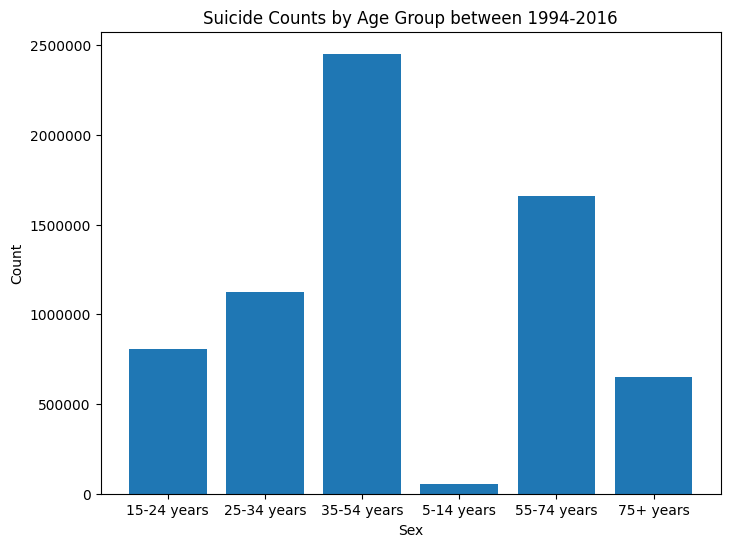

In [ ]:
# Grouping the DataFrame by 'age' and summing 'count of suicides'
sex_suicides = df.groupby('age')['suicides_no'].sum().reset_index()

# Create a bar chart to visualize the number of suicides by sex
plt.figure(figsize=(8, 6))
plt.bar(sex_suicides['age'], sex_suicides['suicides_no'])
plt.title('Suicide Counts by Age Group between 1994-2016')
plt.xlabel('Sex')
plt.ylabel('Count')

# Set y-axis format to 'plain' to remove scientific notation
plt.ticklabel_format(style='plain', axis='y')


plt.show()

In [ ]:


# Grouping the DataFrame by 'year' and summing 'suicides_no'
yearly_suicides = df.groupby('year')['suicides_no'].sum().reset_index()

# Create an interactive bar chart using Plotly Express
fig = px.bar(yearly_suicides, x='year', y='suicides_no', color='year',
             labels={'suicides_no': 'Suicide Counts', 'year': 'Year'},
             title='Suicide Counts by Year between 1994-2016')

# Customize the color scale (optional)
fig.update_traces(marker=dict(line=dict(width=0.5, color='DarkSlateGrey')))

# Show the interactive plot
fig.show()

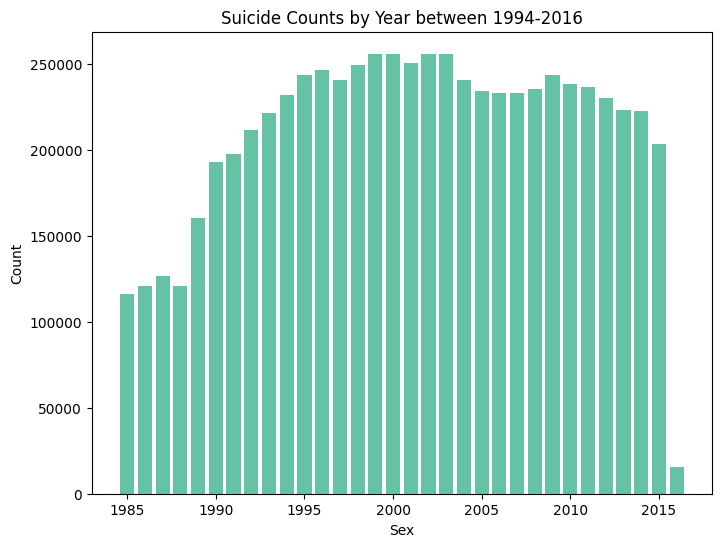

In [ ]:
#Delete - Mintashu
# Grouping the DataFrame by 'sex' and summing 'count of suicides'
sex_suicides = df.groupby('year')['suicides_no'].sum().reset_index()

sns.set_palette("Set2")

# Create a bar chart to visualize the number of suicides by sex
plt.figure(figsize=(8, 6))
plt.bar(sex_suicides['year'], sex_suicides['suicides_no'])
plt.title('Suicide Counts by Year between 1994-2016')
plt.xlabel('Sex')
plt.ylabel('Count')

# Set y-axis format to 'plain' to remove scientific notation
plt.ticklabel_format(style='plain', axis='y')


plt.show()

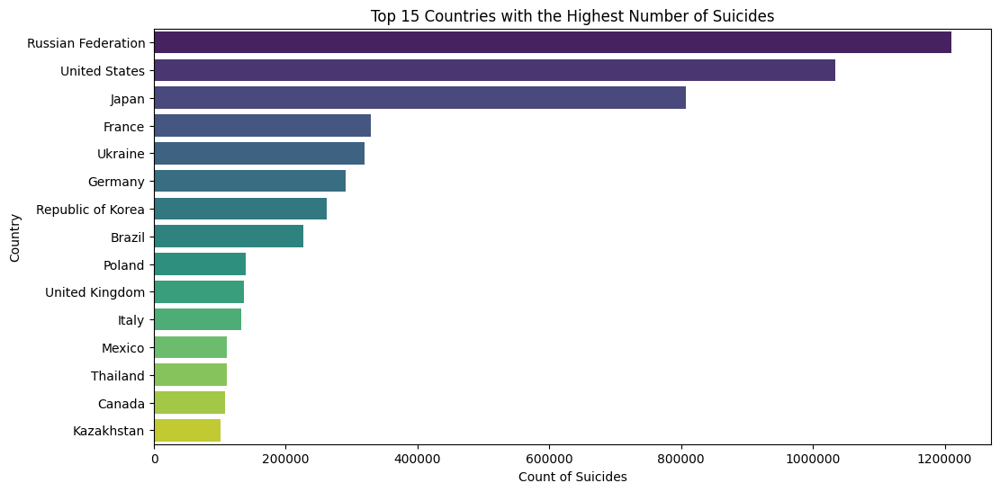

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Grouping the DataFrame by 'country' and summing 'count of suicides'
country_suicides = df.groupby('country')['suicides_no'].sum().reset_index()

# Sorting the results in descending order and selecting the top 15
top_15_countries = country_suicides.sort_values(by='suicides_no', ascending=False).head(15)

# Convert counts to thousands (k)
top_15_countries['suicides_no'] = top_15_countries['suicides_no']   # Convert to thousands

# Create a Seaborn bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='suicides_no', y='country', data=top_15_countries, palette='viridis')
plt.xlabel('Count of Suicides')
plt.ylabel('Country')
plt.title('Top 15 Countries with the Highest Number of Suicides')
plt.gca() # Invert the y-axis to display the top country at the top


plt.ticklabel_format(style='plain', axis='x')
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Grouping the DataFrame by 'country' and summing 'count of suicides'
country_suicides = df.groupby('country')['suicides_no'].sum().reset_index()

# Sorting the results in descending order and selecting the top 5 countries
top_5_countries = country_suicides.sort_values(by='suicides_no', ascending=False).head(5)

# Filter the original DataFrame to include only data for the top 5 countries
top_5_data = df[df['country'].isin(top_5_countries['country'])]

# Group the filtered data by year and country, summing 'count of suicides' and calculating the cumulative sum
top_5_time_series = top_5_data.groupby(['year', 'country'])['suicides_no'].sum().groupby(level=1).cumsum().reset_index()

# Create an interactive time series plot using Plotly Express
fig = px.line(top_5_time_series, x='year', y='suicides_no', color='country',
              labels={'suicides_no': 'Cumulative Count of Suicides', 'year': 'Year'},
              title='Cumulative Time Series of Suicides (1985-2016) for Top 5 Countries')

# Customize the appearance of the plot
fig.update_traces(mode='lines+markers', marker=dict(size=6))
fig.update_layout(legend_title='Country', xaxis_title='Year', yaxis_title='Cumulative Count of Suicides')
fig.show()

In [ ]:
import pandas as pd
import plotly.subplots as sp
import plotly.graph_objs as go

# Filter the DataFrame to include only relevant columns
df_age_gender = df[['age', 'sex', 'suicides_no']]

# Calculate the percentage of suicides by gender for each age group
age_gender_suicides = df_age_gender.groupby(['age', 'sex'])['suicides_no'].sum().reset_index()
age_gender_suicides['total_suicides'] = age_gender_suicides.groupby('age')['suicides_no'].transform('sum')
age_gender_suicides['percentage'] = (age_gender_suicides['suicides_no'] / age_gender_suicides['total_suicides']) * 100

# Get unique age groups
unique_age_groups = age_gender_suicides['age'].unique()

# Create a subplot with a grid layout and 'pie' subplot types
num_rows = 2  # Number of rows in the grid
num_cols = 3  # Number of columns in the grid
fig = sp.make_subplots(rows=num_rows, cols=num_cols, subplot_titles=unique_age_groups, specs=[[{'type':'pie'}]*num_cols]*num_rows)

# Loop through each unique age group and add a pie plot to the subplot
row, col = 1, 1  # Initialize the row and column positions
for age_group in unique_age_groups:
    data = age_gender_suicides[age_gender_suicides['age'] == age_group]
    trace = go.Pie(labels=data['sex'], values=data['percentage'], textinfo='percent+label')
    fig.add_trace(trace, row=row, col=col)

    # Customize the subplot title
    fig.update_layout(title_text=f"Suicide Percentage by Gender for Different Age Groups")

    # Update the row and column positions
    col += 1
    if col > num_cols:
        col = 1
        row += 1

# Show the subplot
fig.show()


# World Stats

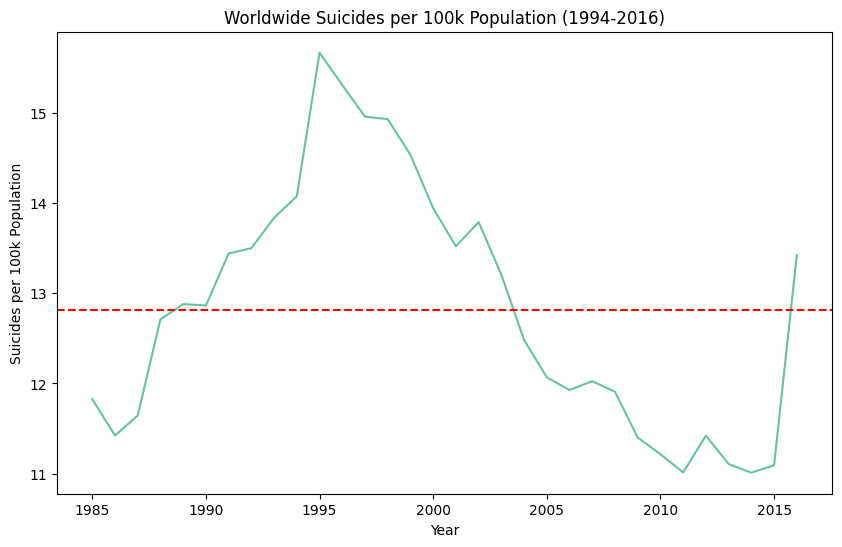

In [ ]:
#Global Trend
# Filter the DataFrame to include only relevant columns and data from 1994 to 2016


# Group the data by 'year' and calculate the mean 'suicides/100k pop' for each year
yearly_suicides_per_100k = df.groupby('year')['suicides/100k pop'].mean().reset_index()


# Calculate the global average suicide rate from 1985 to 2015
global_avg_rate = df[df['year'] < 2016]['suicides/100k pop'].mean()

# Create a line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=yearly_suicides_per_100k, x='year', y='suicides/100k pop')
plt.title('Worldwide Suicides per 100k Population (1994-2016)')
plt.xlabel('Year')
plt.ylabel('Suicides per 100k Population')

plt.axhline(y=global_avg_rate, color='red', linestyle='--', label='Global Avg. Suicide Rate (1985-2015)')
# Show the plot
plt.show()

In [ ]:
# Group the data by 'year', 'sex', and sum 'suicides_no' for each year and gender
yearly_suicides_gender = df.groupby(['year', 'sex'])['suicides/100k pop'].sum().reset_index()

fig = px.line(yearly_suicides_gender, x='year', y='suicides/100k pop', color='sex',
              title='Worldwide Suicide Rate by Gender (1985-2016)',
              labels={'year': 'Year', 'suicides_no': 'Number of Suicides'},
              category_orders={'sex': ['male', 'female']}, markers=True)

# Calculate the average global suicide rate from 1985 to 2016
#global_avg_rate = yearly_suicides_gender['suicides/100k pop'].mean()
average_suicide_rates = yearly_suicides_gender.groupby('year')['suicides/100k pop'].mean().reset_index()

# Create an interactive line plot using Plotly Express with markers
fig = px.line(yearly_suicides_gender, x='year', y='suicides/100k pop', color='sex',
              title='Worldwide Suicide Rate by Gender (1985-2016)',
              labels={'year': 'Year', 'suicides/100k pop': 'Suicides per 100k Population'},
              category_orders={'sex': ['male', 'female']}, markers=True)

# Add a dashed line for the average global suicide rate
fig.add_trace(go.Scatter(x=yearly_suicides_gender['year'], y=[global_avg_rate] * len(yearly_suicides_gender),
                         mode='lines', line=dict(dash='dash'), name='Average Global Rate'))


# Show the interactive plot
fig.show()

In [ ]:
# Group the DataFrame by 'country' and calculate the total suicides per country
country_suicides = df.groupby('country')['suicides_no'].sum().reset_index()

# Create a Choropleth map using Plotly Express
fig = px.choropleth(country_suicides,
                    locations='country',
                    locationmode='country names',
                    color='suicides_no',
                    hover_name='country',
                    color_continuous_scale='Viridis',
                    title='Total Suicides by Country (1984-2016)',
                    labels={'suicides_no': 'Total Suicides'},
                    projection='natural earth')

# Show the interactive plot
fig.show()

# Merging continent **data**

In [ ]:
df2=pd.read_csv('continents2.csv')

In [ ]:
df2

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
244,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,Oceania,Polynesia,NaN,9.0,61.0,NaN
245,Western Sahara,EH,ESH,732,ISO 3166-2:EH,Africa,Northern Africa,NaN,2.0,15.0,NaN
246,Yemen,YE,YEM,887,ISO 3166-2:YE,Asia,Western Asia,NaN,142.0,145.0,NaN
247,Zambia,ZM,ZMB,894,ISO 3166-2:ZM,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0


In [ ]:
df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z


In [ ]:
# Load your existing dataset (df) and the continent dataset (continent_data)


# Merge the datasets based on the 'name' column
merged_df = df.merge(df2[['name', 'region']], left_on='country', right_on='name', how='left')

# Drop the redundant 'name' column from the merged DataFrame
merged_df = merged_df.drop(columns=['name'])

# Now merged_df contains the 'region' column from the continent dataset

In [ ]:
merged_df[merged_df['region'].isna()]['country'].unique()

array(['Bosnia and Herzegovina', 'Macau', 'Republic of Korea',
       'Russian Federation', 'Saint Vincent and Grenadines'], dtype=object)

In [ ]:
merged_df['region'].unique()

array(['Europe', 'Americas', 'Asia', 'Oceania', nan, 'Africa'],
      dtype=object)

In [ ]:
# Define a dictionary to specify the replacements for specific countries
replacement_dict = {
    'Bosnia and Herzegovina': 'Europe',
    'Macau': 'Asia',
    'Republic of Korea': 'Asia',
    'Russian Federation': 'Europe',
    'Saint Vincent and Grenadines': 'Americas'
}

# Manually replace NaN values in the 'region' column with the specified regions
merged_df['region'].fillna(merged_df['country'].map(replacement_dict), inplace=True)



In [ ]:
merged_df['region'].isna().sum()

0

In [ ]:
# Calculate the average suicide rate per 100k by 'region' and 'age'
average_suicide_rate = merged_df.groupby(['region', 'age'])['suicides/100k pop'].mean().reset_index()

# Create a multicolored bar plot using Plotly Express
fig = px.bar(average_suicide_rate, x='region', y='suicides/100k pop', color='age',
             title='Average Suicide Rate per 100k (1985-2016) by Continent and Age Group',
             labels={'region': 'Continent', 'suicides/100k pop': 'Average Suicide Rate per 100k'},barmode='group',
             color_discrete_sequence=px.colors.qualitative.Set1)

# Customize the plot
fig.update_xaxes(categoryorder='total ascending')  # Sort continents by total
fig.update_layout(xaxis_title='', yaxis_title='')

# Show the interactive plot
fig.show()

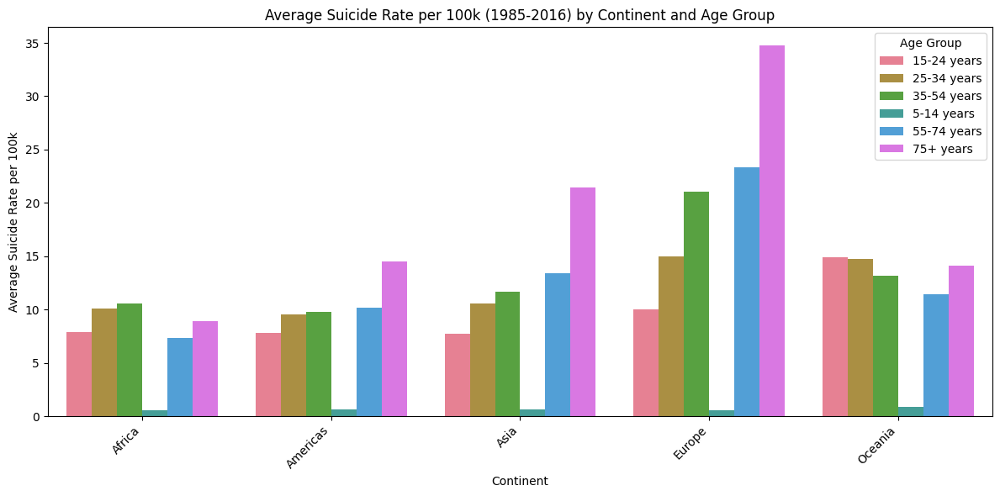

In [ ]:
# Calculate the average suicide rate per 100k by 'region' and 'age'
average_suicide_rate = merged_df.groupby(['region', 'age'])['suicides/100k pop'].mean().reset_index()

# Create a multicolored bar plot using Seaborn
plt.figure(figsize=(12, 6))
palette = sns.color_palette("husl", n_colors=len(average_suicide_rate['age'].unique()))
sns.barplot(data=average_suicide_rate, x='region', y='suicides/100k pop', hue='age', palette=palette)

# Customize the plot
plt.title('Average Suicide Rate per 100k (1985-2016) by Continent and Age Group')
plt.xlabel('Continent')
plt.ylabel('Average Suicide Rate per 100k')
plt.legend(title='Age Group', loc='upper right')
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()








In [ ]:
df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z


In [ ]:
# Create a scatter plot using Plotly Express
fig = px.scatter(df, x='gdp_per_capita ($)', y='suicides/100k pop', color='country',
                 title='GDP vs. Suicide Rate by Country',
                 labels={'gdp_per_capita ($)': 'GDP per Capita', 'suicides/100k pop': 'Suicide Rate'})

# Customize the plot layout
fig.update_xaxes(title_text='GDP per Capita')
fig.update_yaxes(title_text='Suicide Rate')

# Add dropdown filters for countries
fig.update_layout(updatemenus=[dict(type='buttons',
                                    showactive=False,
                                    buttons=[dict(label=c,
                                                  method='update',
                                                  args=[{'visible': [country == c for country in df['country']]}])
                                             for c in df['country'].unique()])])

# Show the interactive plot
fig.show()


In [ ]:
df.columns

Index(['country', 'year', 'sex', 'age', 'suicides_no', 'population',
       'suicides/100k pop', 'country-year', 'HDI for year',
       ' gdp_for_year ($) ', 'gdp_per_capita ($)', 'generation'],
      dtype='object')

In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your dataset is named 'merged_df' and contains relevant columns: 'country', 'region', 'gdp_per_capita', 'suicides/100k pop', 'population'

# Create a bubble plot using Plotly Express
fig = px.scatter(merged_df, x='gdp_per_capita ($)', y='suicides/100k pop', size='population', color='region',
                 title='GDP vs. Suicide Rate by Region (Bubble Plot)',
                 labels={'gdp_per_capita': 'GDP per Capita', 'suicides/100k pop': 'Suicide Rate'},
                 size_max=60)  # Adjust the size of bubbles as needed

# Customize the plot layout
fig.update_xaxes(title_text='GDP per Capita')
fig.update_yaxes(title_text='Suicide Rate')

# Show the interactive bubble plot
fig.show()

In [ ]:
import plotly.express as px

# Assuming your dataset is named 'merged_df' and contains relevant columns: 'country', 'region', 'year', 'gdp_per_capita', 'suicides/100k pop', 'population'

# Create a list of years to loop through
years = merged_df['year'].unique()

# Create a list to store individual figures for each year
figures = []

# Loop through each year and create a bubble plot
for year in years:
    # Filter the data for the current year
    year_df = merged_df[merged_df['year'] == year]

    # Create a bubble plot for the current year using Plotly Express
    fig = px.scatter(year_df, x='gdp_per_capita ($)', y='suicides/100k pop', size='population', color='region',
                     title=f'GDP vs. Suicide Rate by Region ({year})',
                     labels={'gdp_per_capita': 'GDP per Capita', 'suicides/100k pop': 'Suicide Rate'},
                     size_max=60)  # Adjust the size of bubbles as needed

    # Customize the plot layout
    fig.update_xaxes(title_text='GDP per Capita')
    fig.update_yaxes(title_text='Suicide Rate')

    # Append the figure to the list
    figures.append(fig)

# Create an animation of the yearly bubble plots
animation_fig = px.animation(figures, frame_label=years)

# Show the interactive animation
animation_fig.show()

AttributeError: ignored

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming your dataset is named 'merged_df' and contains relevant columns: 'country', 'region', 'year', 'gdp_per_capita', 'suicides/100k pop', 'population'

# Create a list of unique years to loop through
years = merged_df['year'].unique()

# Create an empty list to store frames for the animation
frames = []

# Loop through each year and create a frame for the animation
for year in years:
    # Filter the data for the current year
    year_df = merged_df[merged_df['year'] == year]

    # Create a scatter plot for the current year
    scatter = go.Scatter(
        x=year_df['gdp_per_capita ($)'],
        y=year_df['suicides/100k pop'],
        mode='markers',
        marker=dict(
            size=year_df['population'] / 1e6,  # Adjust the size of bubbles based on population
            color=year_df['region'],
            opacity=0.7,
            colorscale='Viridis',  # Adjust the colorscale as needed
            showscale=True
        ),
        text=year_df['country'],
        name=f'Year {year}'
    )

    # Add the scatter plot to the frame
    frames.append(scatter)

# Create a subplot with frames for animation
fig = make_subplots(rows=1, cols=1)
fig.frames = frames

# Customize the layout
fig.update_xaxes(title_text='GDP per Capita')
fig.update_yaxes(title_text='Suicide Rate')
fig.update_layout(
    title='GDP vs. Suicide Rate by Region (Yearly Animation)',
    showlegend=True
)

# Show the interactive animation
fig.show()


ValueError: ignored

In [ ]:
merged_df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation,region
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X,Europe
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent,Europe
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X,Europe
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation,Europe
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers,Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X,Asia
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent,Asia
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z,Asia
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z,Asia


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your dataset is named 'merged_df' and contains relevant columns: 'generation', 'suicides/100k pop'

# Group the data by 'generation' and calculate the average suicide rate
generation_avg_data = merged_df.groupby('generation')['suicides/100k pop'].mean().reset_index()

# Create a bar plot
fig = px.bar(generation_avg_data, x='generation', y='suicides/100k pop',
             labels={'generation': 'Generation', 'suicides/100k pop': 'Average Suicide Rate'},
             title='Average Suicide Rate by Generation')

# Customize the layout
fig.update_xaxes(type='category')  # Ensure 'generation' is treated as a category
fig.update_traces(marker_color='skyblue')

# Show the interactive plot
fig.show()

In [ ]:
# Assuming your dataset is named 'merged_df' and contains relevant columns: 'year', 'generation', 'suicides/100k pop'
# Assuming your dataset is named 'merged_df' and contains relevant columns: 'year', 'generation', 'suicides/100k pop'

# Group the data by 'year', 'generation', and calculate the average suicide rate
generation_time_series = merged_df.groupby(['year', 'generation'])['suicides/100k pop'].mean().reset_index()

# Convert the 'year' column to a categorical variable with a sorted order
generation_time_series['year'] = pd.Categorical(generation_time_series['year'], categories=generation_time_series['year'].unique(), ordered=True)

# Create a line plot
fig = px.line(generation_time_series, x='year', y='suicides/100k pop', color='generation',
              labels={'year': 'Year', 'suicides/100k pop': 'Average Suicide Rate'},
              title='Time Series of Suicide Rate by Generation')

# Customize the layout
fig.update_xaxes(categoryorder='array', categoryarray=generation_time_series['year'])  # Ensure sorted order
fig.update_traces(mode='lines+markers')

# Show the interactive plot
fig.show()